# Sightseeing in New York City
** Extracting patterns from geolocated venues and events **

Machine learning, and in particular clustering algorithms, can be used to determine which geographical areas are commonly visited and “checked into” by a given user and which areas are not. Such geographical analyses enable a wide range of services, from location-based recommenders to advanced security systems, and in general provide a more personalized user experience. 

I will use these techniques to provide two flavours of predicting analytics: 

First, I will build a simple recommender system which will provide the most trending venues in a given area. In particular, k-means tclustering can be applied to the dataset of geolocated events to partition the map into regions. For each region, we can rank the venues which are most visited. With this information, we can recommend venues and landmarks such as Times Square or the Empire State Building depending of the location of the user.

Second, I’ll determine geographical areas that are specific and personal to each user. In particular, I will use a density-based clustering technique such as DBSCAN to extract the areas where a user usually go. This analysis can be used to determine if a given data point is an _outlier_ with respect to the areas where a user normally checks in. And therefore it can be used to score a "novelty" or "anomaly" factor given the location of a given event

We will analyze this events from a public dataset shared by Gowalla on venues checkins registered between 2008 and 2010. This notebook will cover some typical data science steps:

  - data acquisition
  - data preparation
  - data exploration
  
Thereafter, we will dive into some unsupervised learning techniques: *k-means* and *dbscan* clustering, respectively for recommending popular venues and for determining outliers.

## Imports

In [1]:
%matplotlib inline

import numpy as np
np.random.seed(1337)

import pandas as pd

#time
import pytz as tz
from datetime import datetime

#data import
import wget
import urllib, json
import zipfile

#string regex
import re

In [2]:
#matplotlib
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (20.0, 20.0)
plt.rcParams.update({'font.size': 12})
plt.rcParams['xtick.major.pad']='5'
plt.rcParams['ytick.major.pad']='5'

plt.style.use('ggplot')

## Data Aquisition
### The Gowalla Dataset

The Gowalla dataset provides the anonymozed users who are registering at a specific geolocated venue at a specific timestamp.   
The dataset [1] is available in from https://snap.stanford.edu/data/loc-gowalla.html

[1] E. Cho, S. A. Myers, J. Leskovec. Friendship and Mobility: Friendship and Mobility: User Movement in Location-Based Social Networks ACM SIGKDD International Conference on Knowledge Discovery and Data Mining (KDD), 2011.


In [4]:
import os
import shutil

datadir = './data'
if not os.path.exists(datadir):
    os.makedir(datadir)

In [5]:
# to avoid loading times I would recomend to preload it in the container

url = 'https://snap.stanford.edu/data/loc-gowalla_totalCheckins.txt.gz' 
filename = os.path.join(datadir, 'gowalla_events.csv.gz')

if not os.path.isfile(filename):
    wget.download(url, out=filename)
    
# no need to uncompress, pandas can read compressed csv files, 
# by inferring the compression type from the filename extension

The venues names [2] in New York City are fetched from :   
https://storage.googleapis.com/google-code-archive-downloads/v2/code.google.com/locrec/gowalla-dataset.zip   

[2] The project is being developed in the context of the SInteliGIS project financed by the Portuguese Foundation for Science and Technology (FCT) through project grant PTDC/EIA-EIA/109840/2009. 


In [6]:
# to avoid loading times I would recomend to preload it in the container

url = 'https://storage.googleapis.com/google-code-archive-downloads/v2/code.google.com/locrec/gowalla-dataset.zip' 

src_filename = os.path.join(datadir, 'gowalla-dataset.zip')
trg_filename = os.path.join(datadir, 'gowalla_venues.csv')

if not os.path.isfile(trg_filename):
    # download
    wget.download(url, out=src_filename)
    
    #extract
    zf = zipfile.ZipFile(src_filename, 'r')
    extracted_file = zf.extract('gowalla-dataset/spots.txt', datadir)

    tmp_filename = shutil.copy(extracted_file, datadir)
    shutil.rmtree(os.path.dirname(extracted_file))

    #preprocess
    regex = re.compile(r'POINT\((\-?\d+\.\d+)\s+(\-?\d+\.\d+)\)')

    with open(tmp_filename, "r") as src, \
         open(trg_filename, "w") as dst  :
    
        next(src) 
        for line in src: 
            dst.write(regex.sub(r'\2\t\1', line))

    #cleanup
    os.remove(src_filename)
    os.remove(tmp_filename)
    

## Data preparation

### Loading the events data
This dataset contains just 5 columns. Although the dataset contains datapoints spread out all over the world, we are going to limit our analysis to the city of New York. Let's start first by importing the data in a pandas dataframe.

In [7]:
filename = os.path.join(datadir, 'gowalla_events.csv.gz')

dfe = pd.read_csv(filename, sep='\t', header=None)
dfe.columns = ['uid','timestamp','lat','lon','vid']
dfe.head(3)

,uid,timestamp,lat,lon,vid
0,0,2010-10-19T23:55:27Z,30.235909,-97.795140,22847
1,0,2010-10-18T22:17:43Z,30.269103,-97.749395,420315
2,0,2010-10-17T23:42:03Z,30.255731,-97.763386,316637


### Filtering New York City venues
Now let's filter the dataset to the area of New York City.   

The Flickr API provides us with the bounding box of the city.    
`https://www.flickr.com/places/info/2459115`

`
Bounding Box:	-74.2589, 40.4774, -73.7004, 40.9176
Centroid:	    -74.0071, 40.7146
`

In [8]:
lon_min, lat_min, lon_max, lat_max = -74.2589, 40.4774, -73.7004, 40.9176

dfe = dfe[ (dfe['lon']>lon_min) & 
           (dfe['lon']<lon_max) & 
           (dfe['lat']>lat_min) & 
           (dfe['lat']<lat_max) ]

dfe.head(3)

,uid,timestamp,lat,lon,vid
10,0,2010-10-12T00:21:28Z,40.643885,-73.782806,23261
11,0,2010-10-11T20:21:20Z,40.741374,-73.988105,16907
12,0,2010-10-11T20:20:42Z,40.741388,-73.989455,12973


### Parse and localize Date and Time

In [9]:
def parse_datetime(s):
    tzone = tz.timezone("America/New_York")
    utc = datetime.strptime(s, '%Y-%m-%dT%H:%M:%SZ')
    return tz.utc.localize(utc).astimezone(tzone)

dfe['ts'] = dfe['timestamp'].apply(lambda x: parse_datetime(x))
dfe = dfe.drop('timestamp',axis=1,errors='ignore')

#local date and time
dfe['date']  = dfe['ts'].astype(object).apply(lambda x : x.date())
dfe['time']  = dfe['ts'].astype(object).apply(lambda x : x.time())

#day of the week (localtime)
#hour of the day (localtime)
dfe['wd']  = dfe['date'].astype(object).apply(lambda x : x.weekday())
dfe['d']   = dfe['date'].astype(object).apply(lambda x : x.day)
dfe['h']   = dfe['time'].astype(object).apply(lambda x : x.hour)

dfe.head(3)

,uid,lat,lon,vid,ts,date,time,wd,d,h
10,0,40.643885,-73.782806,23261,2010-10-11 20:21:28-04:00,2010-10-11,20:21:28,0,11,20
11,0,40.741374,-73.988105,16907,2010-10-11 16:21:20-04:00,2010-10-11,16:21:20,0,11,16
12,0,40.741388,-73.989455,12973,2010-10-11 16:20:42-04:00,2010-10-11,16:20:42,0,11,16


### Loading the venues data
This dataset contains just 4 columns. Let's start first by importing the data in a pandas dataframe.

In [10]:
filename = os.path.join(datadir, 'gowalla_venues.csv')

dfv = pd.read_csv(filename, sep='\t', header=None)
dfv.columns = ['vid','name','lat','lon']
dfv.head(3)

,vid,name,lat,lon
0,1391604,Conference House Park,40.501759,-74.252343
1,1391611,Almer G. Russell Pavilion,40.502265,-74.254264
2,3612422,Conference House,40.500064,-74.249042


### Merge events and venues data
Let's consider only events for which the venue has a known name

In [11]:
dfe = pd.DataFrame.merge(dfe,dfv[['vid']], on='vid', how="inner")
dfe.head(3)

,uid,lat,lon,vid,ts,date,time,wd,d,h
0,0,40.643885,-73.782806,23261,2010-10-11 20:21:28-04:00,2010-10-11,20:21:28,0,11,20
1,0,40.643885,-73.782806,23261,2010-10-07 11:27:40-04:00,2010-10-07,11:27:40,3,7,11
2,5,40.643885,-73.782806,23261,2010-08-15 23:47:20-04:00,2010-08-15,23:47:20,6,15,23


## Data exploration

First off to kick this initial analysis, lat us plot the events registered ordered temporally by increasing timestamps and grouped by date. This gives an idea of the popularity of the gowalla application during the period Jun 2009 till Oct 2010.

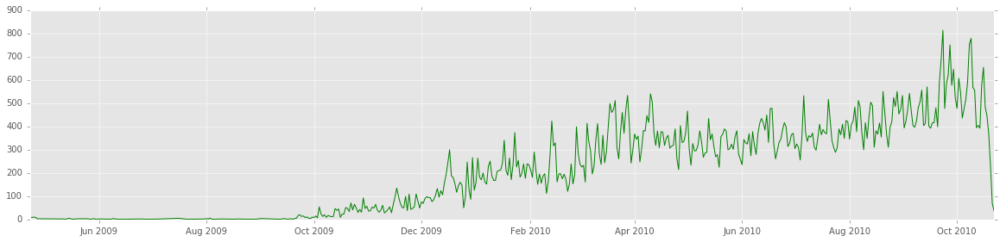

In [12]:
plt.style.use('ggplot')
plt.subplot(4, 1, 1)
top = dfe.groupby('date').size()
plt.plot(top.index, top, 'g-')

plt.show()

Let's start with answering some simple questions about the data:

  - what is the distribution of events per hour of the day, per day of the week?
  - what is the histograms of number of events registered per user?
  - which are the most popular venue of all time?

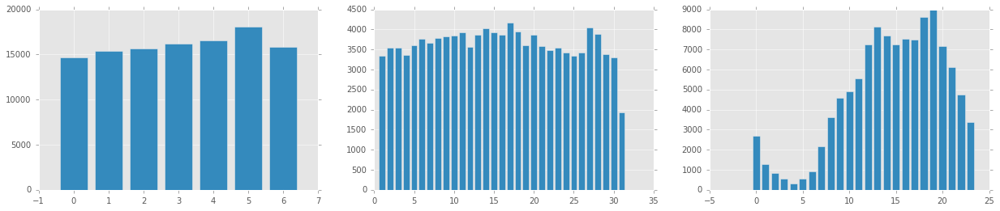

In [13]:
plt.style.use('ggplot')
fig = plt.figure()
fig.set_size_inches(21,4)

plt.subplot(1, 3, 1)
top = dfe.groupby('wd').size()
plt.bar(top.index, top,align='center')

plt.subplot(1, 3, 2)
top = dfe.groupby('d').size()
plt.bar(top.index, top,align='center')

plt.subplot(1, 3, 3)
top = dfe.groupby('h').size()
plt.bar(top.index, top,align='center')

plt.show()

Interesting facts: The week seems to build up towards saturday as most popular day to record and share memorable events and venues. The end of the month has a splurge of activities (most likely to be connected with happy people getting their salaries). Finally, as expected, activity peaks during lunch and dinner times.

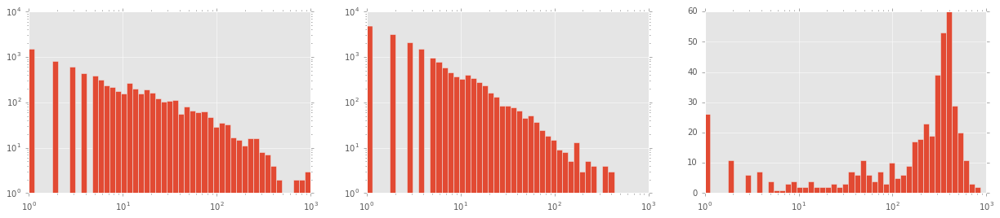

In [14]:
plt.style.use('ggplot')
fig = plt.figure()
fig.set_size_inches(21,4)

plt.subplot(1, 3, 1)
top = dfe.groupby('uid').size()
plt.hist(top, bins=np.logspace(0, 3, 50))
plt.gca().set_xscale("log")
plt.gca().set_yscale("log")

plt.subplot(1, 3, 2)
top = dfe.groupby('vid').size()
plt.hist(top, bins=np.logspace(0, 3, 50))
plt.gca().set_xscale("log")
plt.gca().set_yscale("log")

plt.subplot(1, 3, 3)
top = dfe.groupby('date').size()
plt.hist(top, bins=np.logspace(0, 3, 50))
plt.gca().set_xscale("log")

plt.show()

Both venues and users exhibit a typical [zipf's law](https://en.wikipedia.org/wiki/Zipf%27s_law) behavior. Most of the registered events is related to a small numbers of users and venues The number of the events registered is inversely to the rank order. This applies both to users as well as venues. The third histogram shows that 60 is the most common number of events registered in a day in the city of New York, given the data available.

In [15]:
top = dfe.groupby(['vid']).size()
dfv.join(top.rename('count'), on='vid', how='inner').sort_values(by='count', ascending=False).head(10)


,vid,name,lat,lon,count
24140,12505,LGA LaGuardia Airport,40.774578,-73.872006,1680
5642,23261,JFK John F. Kennedy International,40.643885,-73.782806,1654
2165,24963,EWR Newark Liberty International,40.691247,-74.179516,1089
13382,11844,Times Square,40.756880,-73.986225,1089
18079,13022,Grand Central Terminal,40.752792,-73.977256,1005
9305,11875,Madison Square Garden,40.750614,-73.993435,430
19084,12525,The Museum of Modern Art (MoMA),40.761255,-73.977580,392
12880,12313,Empire State Building,40.748444,-73.985732,390
27189,11720,Yankee Stadium,40.829406,-73.927431,376
14487,11834,Bryant Park,40.753816,-73.983618,364


This initial analysis is a global cumulative analysis which does not take into account the fact that each area of the city as a specific  dynamic.
we could of course divide the city using an uniform grid, but this will not render justice to areas in manhattan which are highly popular.

In [16]:
top = dfe.groupby(['uid']).size()
top.sort_values(ascending=False).head(10)


uid
578     1642
22      1290
842     1145
4985    1063
4902     968
4929     925
2798     919
3480     785
2964     779
1201     740
dtype: int64

## Exploring events on the New York Map

In [17]:
from PIL import Image

def get_map(x,y,z,size, filename) :
    static_map = "http://staticmap.openstreetmap.de/staticmap.php?center={0},{1}&zoom={2}&size={3}x{3}&maptype=mapnik".format(y,x,z,size)

    static_map_filename, headers = urllib.request.urlretrieve(static_map, filename)
    return static_map_filename

def geomap(data, zoom=13, point_size=3, point_color='r', point_alpha=1):
    #corrections to match geo with static map
    z=zoom
    picsize=1000
    wx = 1.0*360*(picsize/256)/(2**z) 
    wy = 0.76*360*(picsize/256)/(2**z) 

    #center of manhattan
    y = 40.7502
    x = -73.9752

    x_min, x_max = x-wx/2, x+wx/2
    y_min, y_max = y-wy/2, y+wy/2

    static_map_filename = os.path.join(datadir, 'nyc_staticmap_{}_{}.png'.format(z,picsize))

    if os.path.isfile(static_map_filename)==False:
        get_map(x,y,z,picsize,static_map_filename)

    img = Image.open(static_map_filename)

    #add the static map
    plt.imshow(img,zorder=0, extent=[x_min, x_max, y_min, y_max], interpolation='none', aspect='auto')

    #add the scatter plot of events
    plt.plot( 
        data['lon'], 
        data['lat'], 
        '.', 
        markerfacecolor=point_color, 
        markeredgecolor='k', 
        markersize=point_size, 
        alpha=point_alpha)

    #limit the plot to the given box
    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)



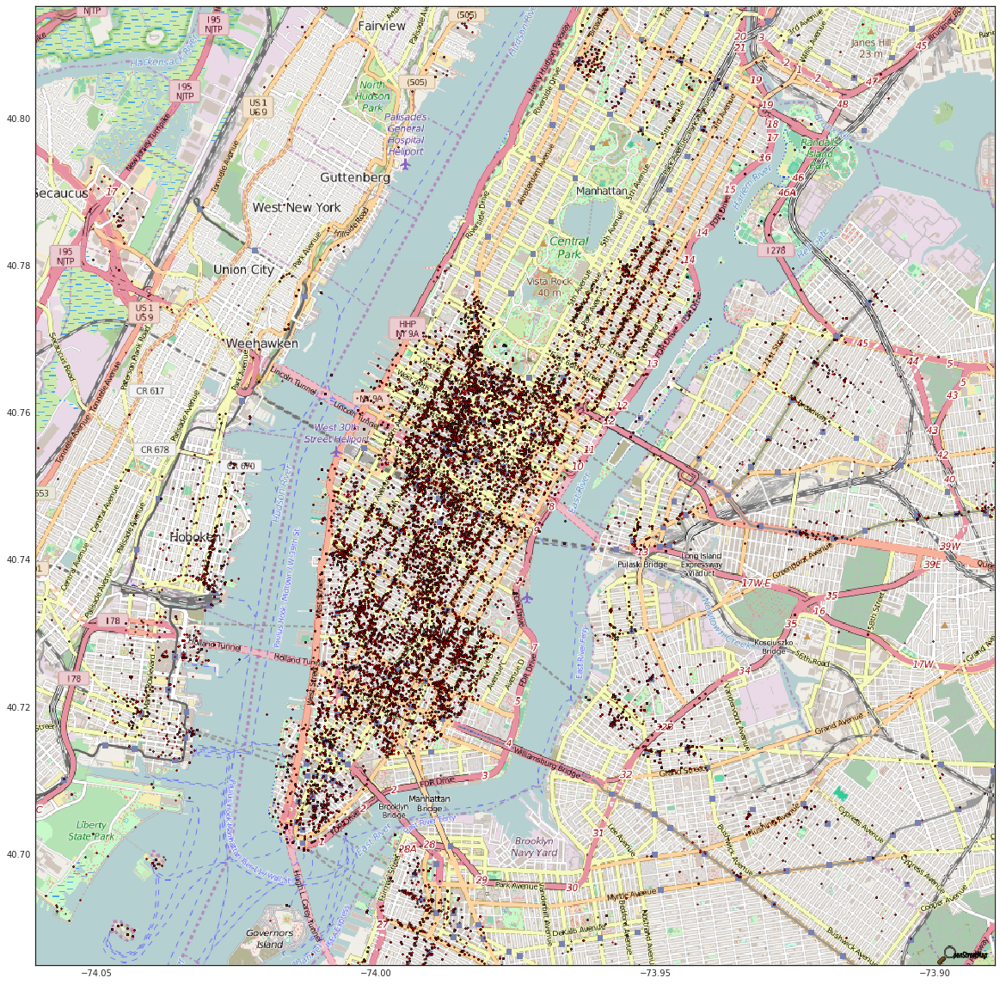

In [18]:
#prepare the figure
plt.style.use('seaborn-white')

fig = plt.figure()
fig.set_size_inches(20,20)

geomap(dfe[['lon','lat']])

plt.show()

In [19]:
from sklearn.cluster import KMeans

from sklearn import metrics
from sklearn.metrics import pairwise_distances

In [20]:
ml = KMeans(n_clusters=200, init='k-means++')
ml.fit(dfe[['lon','lat']].sample(frac=0.1))

KMeans(copy_x=True, init='k-means++', max_iter=300, n_clusters=200, n_init=10,
    n_jobs=1, precompute_distances='auto', random_state=None, tol=0.0001,
    verbose=0)

In [21]:
clusters = ml.cluster_centers_
clusters[:10]

array([[-73.98696622,  40.7671535 ],
       [-73.84566339,  40.72252368],
       [-74.1727739 ,  40.66929104],
       [-74.00975677,  40.71699383],
       [-74.1510486 ,  40.88617213],
       [-73.78250694,  40.64423592],
       [-73.99018009,  40.66484501],
       [-73.94484569,  40.8335741 ],
       [-73.98686609,  40.74903694],
       [-74.17214458,  40.73471851]])

In [22]:
dfe['cluster'] = ml.predict(dfe[['lon','lat']])
dfe[['uid','lat','lon','vid','cluster']].sample(10)

,uid,lat,lon,vid,cluster
93168,123377,40.808521,-73.959615,57029,196
57843,1546,40.796809,-73.949264,36669,36
50971,578,40.770477,-73.950797,1249847,131
19638,152760,40.747000,-73.987058,443501,8
84916,6481,40.724795,-73.994765,172699,53
105414,32919,40.721513,-73.994005,1484280,53
46822,2798,40.759878,-73.976498,199959,81
70504,12060,40.679348,-73.968392,994029,45
65599,4039,40.737218,-73.990881,160333,188
97849,37368,40.717733,-73.956285,755856,80


In [23]:
from scipy.spatial import Voronoi

def voronoi_finite_polygons_2d(vor, radius=None):
    """
    Reconstruct infinite voronoi regions in a 2D diagram to finite
    regions.

    Parameters
    ----------
    vor : Voronoi
        Input diagram
    radius : float, optional
        Distance to 'points at infinity'.

    Returns
    -------
    regions : list of tuples
        Indices of vertices in each revised Voronoi regions.
    vertices : list of tuples
        Coordinates for revised Voronoi vertices. Same as coordinates
        of input vertices, with 'points at infinity' appended to the
        end.

    """

    if vor.points.shape[1] != 2:
        raise ValueError("Requires 2D input")

    new_regions = []
    new_vertices = vor.vertices.tolist()

    center = vor.points.mean(axis=0)
    if radius is None:
        radius = vor.points.ptp().max()*2

    # Construct a map containing all ridges for a given point
    all_ridges = {}
    for (p1, p2), (v1, v2) in zip(vor.ridge_points, vor.ridge_vertices):
        all_ridges.setdefault(p1, []).append((p2, v1, v2))
        all_ridges.setdefault(p2, []).append((p1, v1, v2))

    # Reconstruct infinite regions
    for p1, region in enumerate(vor.point_region):
        vertices = vor.regions[region]

        if all([v >= 0 for v in vertices]):
            # finite region
            new_regions.append(vertices)
            continue

        # reconstruct a non-finite region
        ridges = all_ridges[p1]
        new_region = [v for v in vertices if v >= 0]

        for p2, v1, v2 in ridges:
            if v2 < 0:
                v1, v2 = v2, v1
            if v1 >= 0:
                # finite ridge: already in the region
                continue

            # Compute the missing endpoint of an infinite ridge

            t = vor.points[p2] - vor.points[p1] # tangent
            t /= np.linalg.norm(t)
            n = np.array([-t[1], t[0]])  # normal

            midpoint = vor.points[[p1, p2]].mean(axis=0)
            direction = np.sign(np.dot(midpoint - center, n)) * n
            far_point = vor.vertices[v2] + direction * radius

            new_region.append(len(new_vertices))
            new_vertices.append(far_point.tolist())

        # sort region counterclockwise
        vs = np.asarray([new_vertices[v] for v in new_region])
        c = vs.mean(axis=0)
        angles = np.arctan2(vs[:,1] - c[1], vs[:,0] - c[0])
        new_region = np.array(new_region)[np.argsort(angles)]

        # finish
        new_regions.append(new_region.tolist())

    return new_regions, np.asarray(new_vertices)

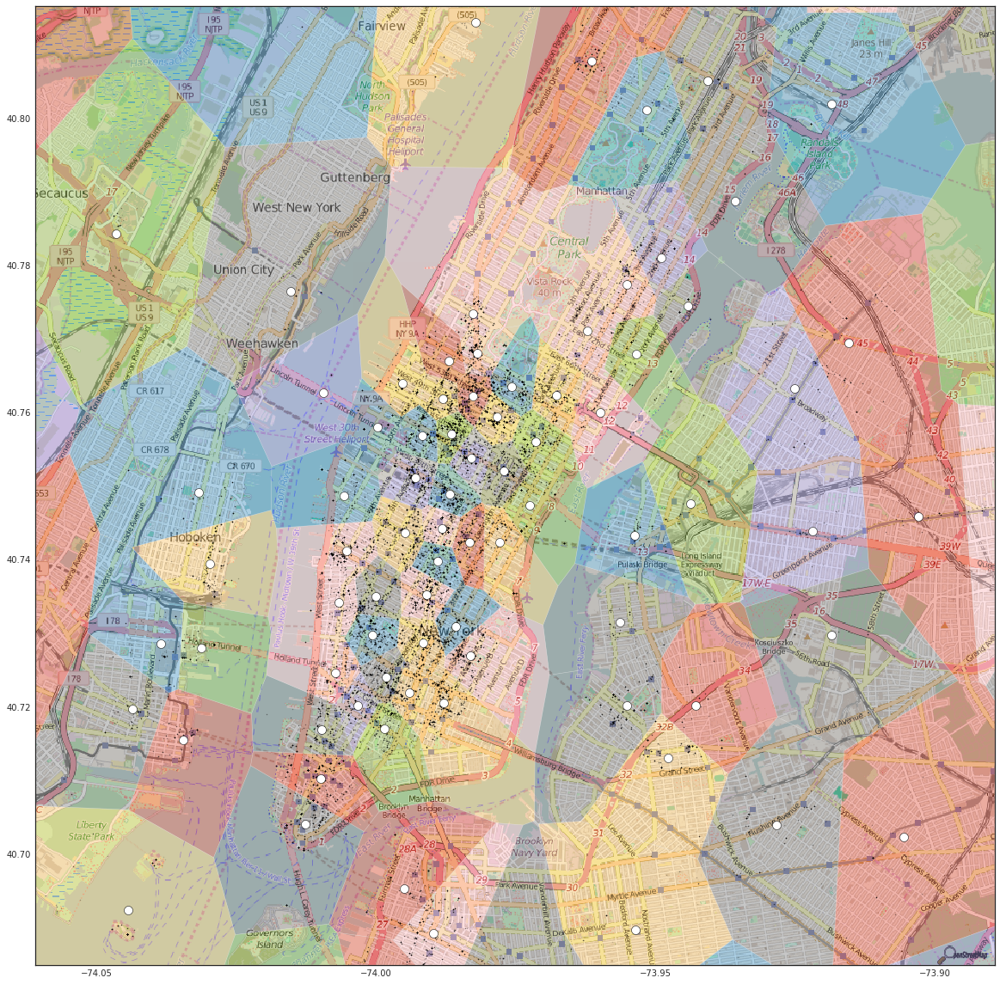

In [24]:
#points = np.array([[c[1], c[0]] for c in clusters])
points = clusters

# compute Voronoi tesselation
vor = Voronoi(points)

# compute regions
regions, vertices = voronoi_finite_polygons_2d(vor)

# prepare figure
plt.style.use('seaborn-white')
fig = plt.figure()
fig.set_size_inches(20,20)

#geomap
geomap(dfe[['lon','lat']], 13, 2,'k',0.1)

# centroids
plt.plot(points[:,0], points[:,1], 'wo',markersize=10)

# colorize
for region in regions:
    polygon = vertices[region]
    plt.fill(*zip(*polygon), alpha=0.4)

plt.show()



In [25]:
gdf = dfe.groupby(['cluster', 'vid']).size().reset_index()
gdf.columns = ['cluster', 'vid', 'count']

idx = gdf.groupby(['cluster'])['count'].transform(max) == gdf['count']
topvenues_df = gdf[idx].merge(dfv, on='vid', how='left').sort_values(by='count', ascending=False)

In [26]:
#top 10 out of 200 clusters by events count
df = topvenues_df[:10]
df

,cluster,vid,count,name,lat,lon
29,26,12505,1680,LGA LaGuardia Airport,40.774578,-73.872006
5,5,23261,1654,JFK John F. Kennedy International,40.643885,-73.782806
25,22,24963,1089,EWR Newark Liberty International,40.691247,-74.179516
136,124,11844,1089,Times Square,40.756880,-73.986225
164,150,13022,1005,Grand Central Terminal,40.752792,-73.977256
111,100,11875,430,Madison Square Garden,40.750614,-73.993435
87,81,12525,392,The Museum of Modern Art (MoMA),40.761255,-73.977580
8,8,12313,390,Empire State Building,40.748444,-73.985732
184,169,11720,376,Yankee Stadium,40.829406,-73.927431
78,72,11834,364,Bryant Park,40.753816,-73.983618


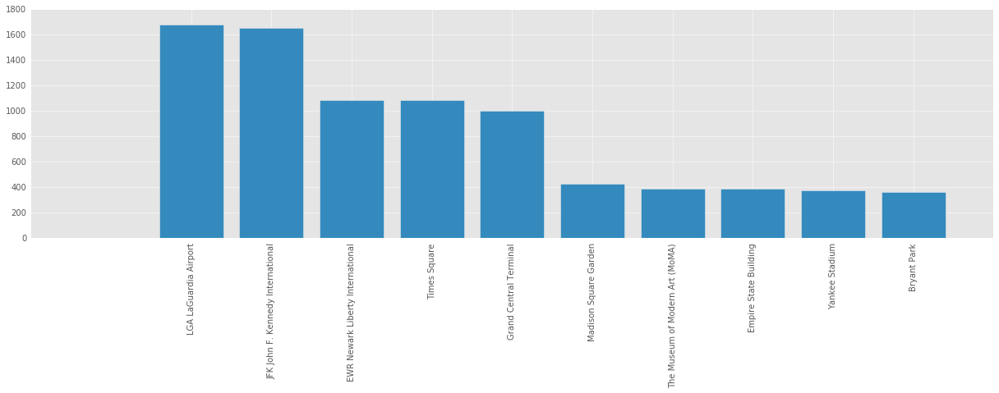

In [27]:
# prepare figure
plt.style.use('ggplot')
fig = plt.figure()
fig.set_size_inches(21,5)

plt.bar( range(len(df)), df['count'], align='center')
plt.xticks(range(len(df)),df['name'], rotation='vertical')
plt.show()


In [28]:
from IPython.display import HTML

def geturl(s):
    s=urllib.parse.quote(s)
    url='https://en.wikipedia.org/w/api.php?action=opensearch&search={}&limit=1&format=json'.format(s)
    req = urllib.request.Request(url)
    resp = urllib.request.urlopen(req)
    return json.loads(resp.read().decode('utf-8'))[3]
   
def recommend_venues(df, lon, lat):
    cl = ml.predict(np.array([lon,lat]).reshape(1,-1))[0]
    venue_name = df[df['cluster']==cl].iloc[0]['name']
    url = geturl(venue_name)
    if url:
        venue_html = '<a href="{}">{}</a>?'.format(url[0], venue_name)
    else:
        venue_html = venue_name
    msg = 'What about visiting the {}?'.format(venue_html)
    return HTML(msg)

In [29]:
recommend_venues(topvenues_df, -74.01, 40.7)

In [30]:
recommend_venues(topvenues_df, -74, 40.72)

In [31]:
recommend_venues(topvenues_df, -74, 40.55)

## Density based scanning: the DBSCAN algorithm

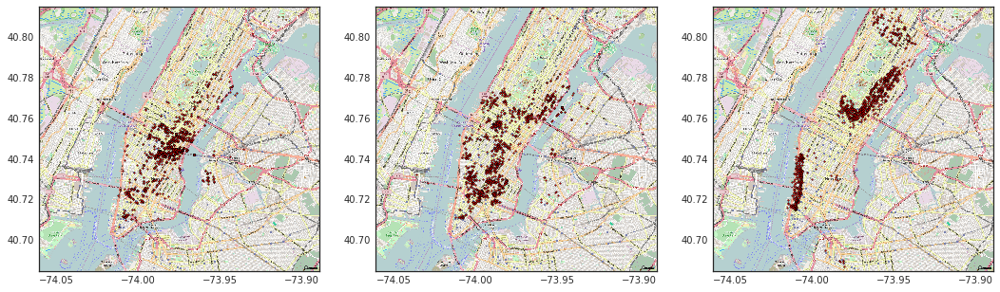

In [32]:
#prepare the figure
plt.style.use('seaborn-white')
fig = plt.figure()
fig.set_size_inches(18,5)

plt.subplot(1, 3, 1)
geomap(dfe[dfe['uid']==578][['lon','lat']])

plt.subplot(1, 3, 2)
geomap(dfe[dfe['uid']==22][['lon','lat']])

plt.subplot(1, 3, 3)
geomap(dfe[dfe['uid']==842][['lon','lat']])

plt.show()

In [33]:
from sklearn.cluster import DBSCAN

uid =4902

#1deg at 40deg latitude is 111034.61 meters
#set radius at 300 mt
eps = 260/111034.61

data = dfe[dfe['uid']==uid][['lon','lat','vid']]
db = DBSCAN(eps=eps, min_samples=3).fit(np.array(data[['lon','lat']]))

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True

data['dbscan_cluster'] =  db.labels_
data['dbscan_core']    = core_samples_mask
print("# clusters: {}".format(len(set(data['dbscan_cluster']))))

# clusters: 21


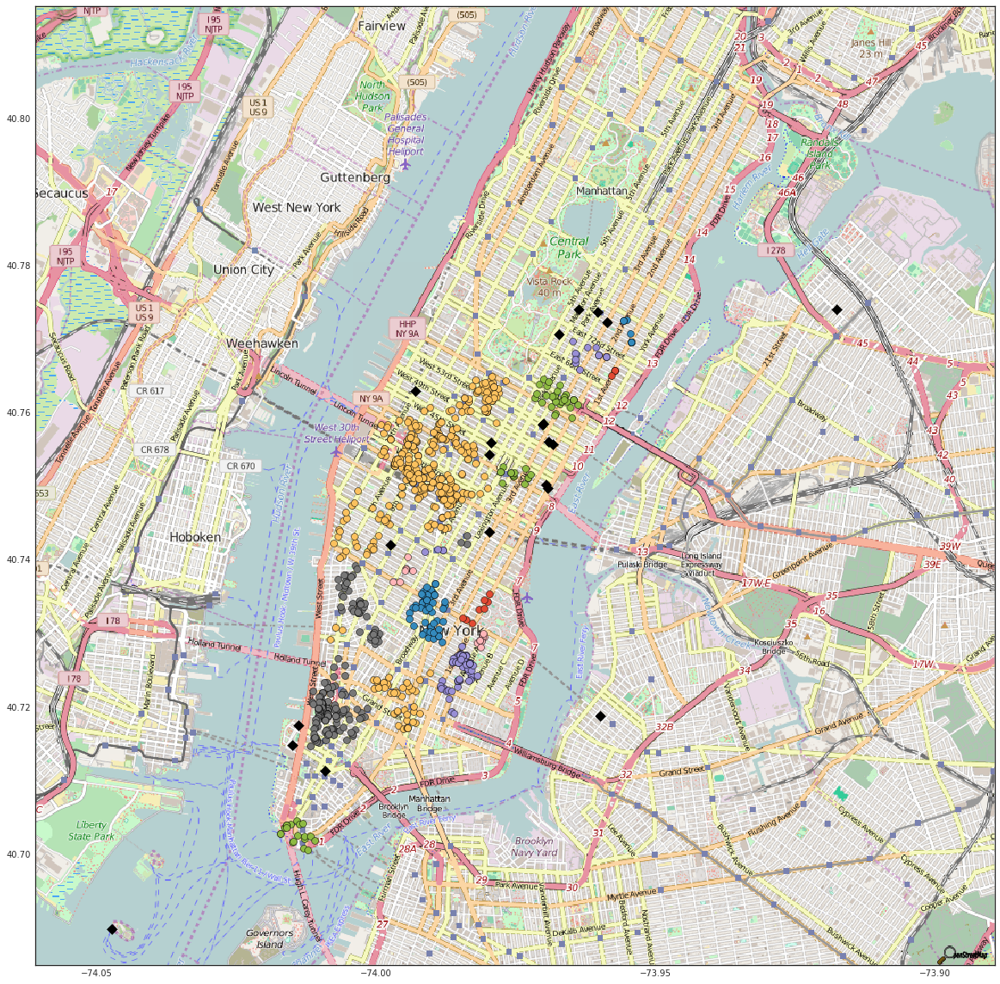

In [34]:
# prepare figure
plt.style.use('seaborn-white')
fig = plt.figure()
fig.set_size_inches(20,20)

empty= pd.DataFrame(columns=['lon','lat'])
geomap(empty, 13, 2,'k',0.1)

unique_labels = sorted(set(data['dbscan_cluster']))

for k in unique_labels:
    xy = data[data['dbscan_cluster']==k]
    plt.plot(xy['lon'], xy['lat'], 'kD' if k<0 else 'o', markersize=8)

plt.show()

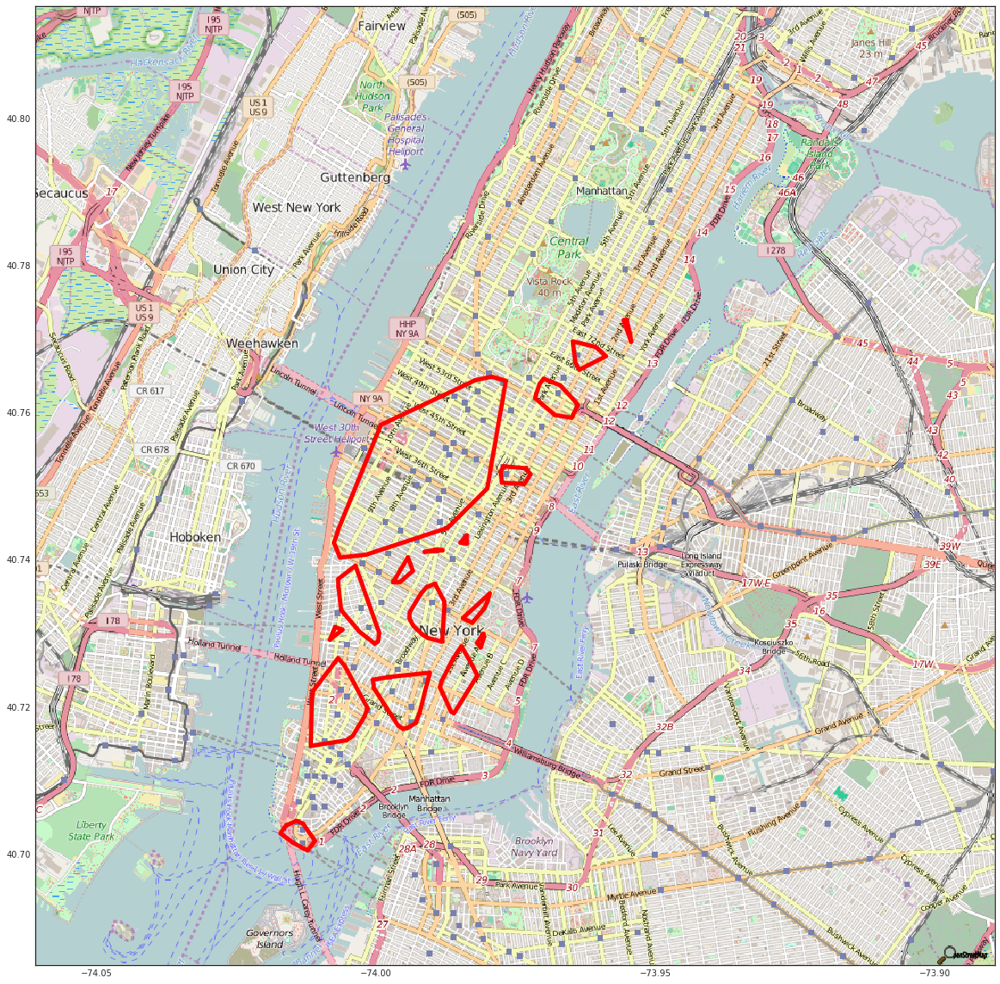

In [35]:
from scipy.spatial import ConvexHull

plt.style.use('seaborn-white')
fig = plt.figure()
fig.set_size_inches(20,20)

empty= pd.DataFrame(columns=['lon','lat'])
geomap(empty, 13, 2,'k',0.1)

for k in unique_labels:
    if k>=0:
        xy = data[data['dbscan_cluster']==k][['lon','lat']].reset_index(drop=True)
        try:
            hull = ConvexHull(xy.as_matrix())
            for simplex in hull.simplices:
                plt.plot(xy.iloc[simplex]['lon'], xy.iloc[simplex]['lat'], 'r-', lw=5)
        except:
            pass

plt.show()    

In [36]:
stats = []

for k in unique_labels:
    if k>=0:
        xy = data[data['dbscan_cluster']==k][['lon','lat']].reset_index(drop=True)
        try:
            hull = ConvexHull(xy.as_matrix())
            stats.append([k,hull.area, hull.npoints])
        except:
            pass

stats_df = pd.DataFrame(stats, columns=['cluster', 'area', 'count'])

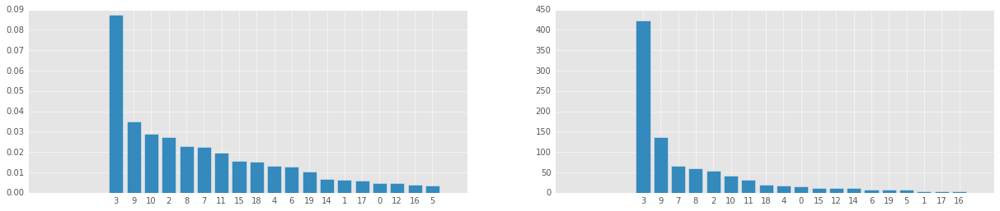

In [37]:
plt.style.use('ggplot')
fig = plt.figure()
fig.set_size_inches(21,4)

plt.subplot(1, 2, 1)
stats_df = stats_df.sort_values('area', ascending=False).reset_index(drop=True)
plt.bar(stats_df.index, stats_df['area'],align='center')
plt.xticks(range(len(stats_df)),stats_df['cluster'])

plt.subplot(1, 2, 2)
stats_df = stats_df.sort_values('count', ascending=False).reset_index(drop=True)
plt.bar(stats_df.index, stats_df['count'],align='center')
plt.xticks(range(len(stats_df)),stats_df['cluster'])

plt.show()

In [38]:
hulls = []

for k in unique_labels:
    if k>=0:
        xy = data[data['dbscan_cluster']==k][['lon','lat']].reset_index(drop=True)
        xy = xy.as_matrix()
        try:
            hull = ConvexHull(xy)
            hull_vertices = [ [xy[i][0], xy[i][1]] for i in hull.vertices ]
            hulls.append(hull_vertices)
        except:
            pass

In [39]:
from scipy.spatial import Delaunay
def in_hull(p, convexhull):
    """
    Test if points in `p` are in `hull`

    `p` should be a `NxK` coordinates of `N` points in `K` dimensions
    `hull` is either a scipy.spatial.Delaunay object or the `MxK` array of the 
    coordinates of `M` points in `K`dimensions for which Delaunay triangulation
    will be computed
    """
    if not isinstance(convexhull,Delaunay):
        hull = Delaunay(convexhull)

    return hull.find_simplex(p)>=0

In [40]:
def location_alert(hulls, lon, lat):
    """
    Determine if the given point is within any of the given convex hulls
    If not, it gives  
    """
    result = False
    for k in list(range(len(hulls))):
        result = result or in_hull([lon, lat], hulls[k])
    return (not result)

In [41]:
location_alert(hulls, -73.99, 40.75)


False

In [42]:
location_alert(hulls, -73.99, 43.75)

True